In [2]:
import pandas as pd

train = pd.read_csv("C:\\Users\\yashu\\Downloads\\archive (11)\\twitter_training.csv")
val = pd.read_csv("C:\\Users\\yashu\\Downloads\\archive (11)\\twitter_validation.csv")
train.columns = ['tweet_id', 'sentiment', 'entity', 'text']

print(train.columns)

Index(['tweet_id', 'sentiment', 'entity', 'text'], dtype='object')


In [3]:
import re

def clean_text(text):
    text = re.sub(r"http\S+|@\w+|#\w+", "", text)  # Remove URLs, mentions, hashtags
    text = re.sub(r"[^\w\s]", "", text)            # Remove punctuation
    return text.lower()

train['text'] = train['text'].astype(str).apply(clean_text)

print(train[['sentiment', 'text']].head())

     sentiment                                               text
0  Borderlands  i am coming to the borders and i will kill you...
1  Borderlands  im getting on borderlands and i will kill you all
2  Borderlands  im coming on borderlands and i will murder you...
3  Borderlands  im getting on borderlands 2 and i will murder ...
4  Borderlands  im getting into borderlands and i can murder y...


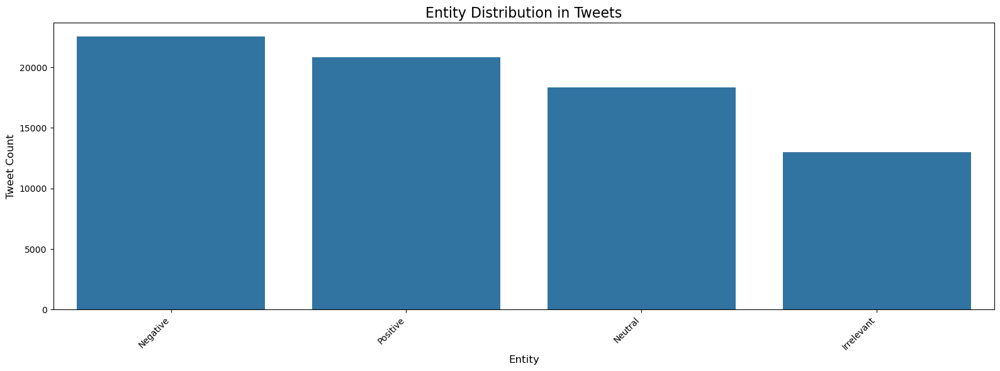

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 6))  # Wider figure to avoid squeezing

sns.countplot(x='entity', data=train, order=train['entity'].value_counts().index[:30])  # show top 30 entities
plt.title("Entity Distribution in Tweets", fontsize=16)
plt.xlabel("Entity", fontsize=12)
plt.ylabel("Tweet Count", fontsize=12)

plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate and align labels
plt.tight_layout()
plt.show()

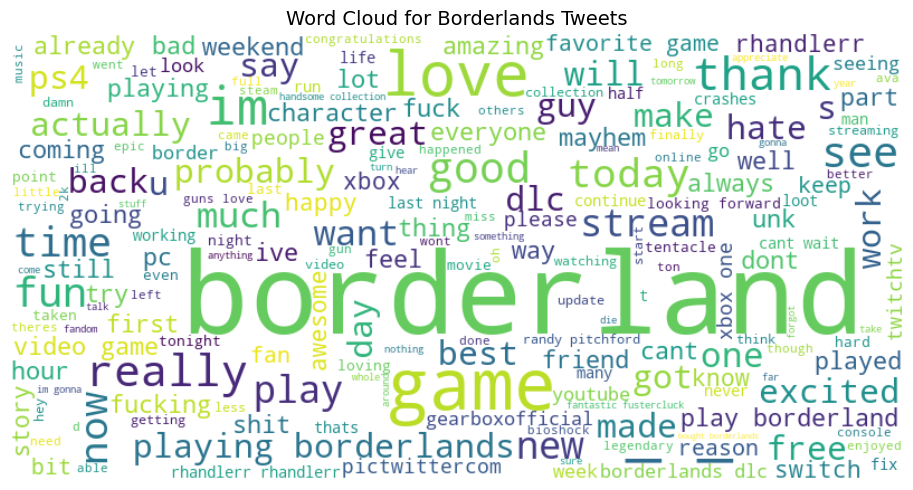

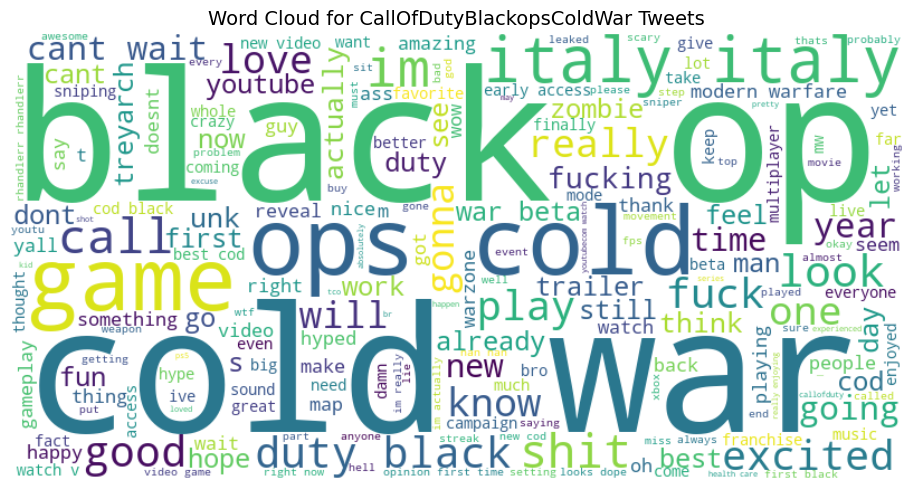

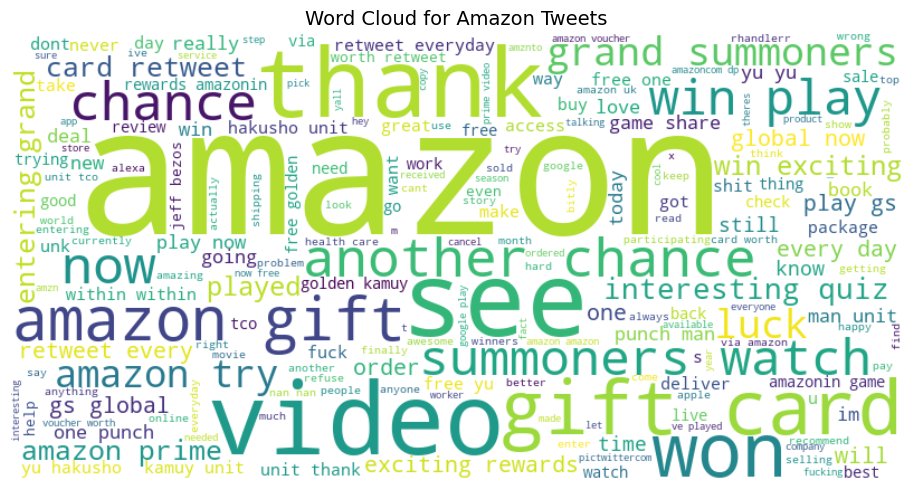

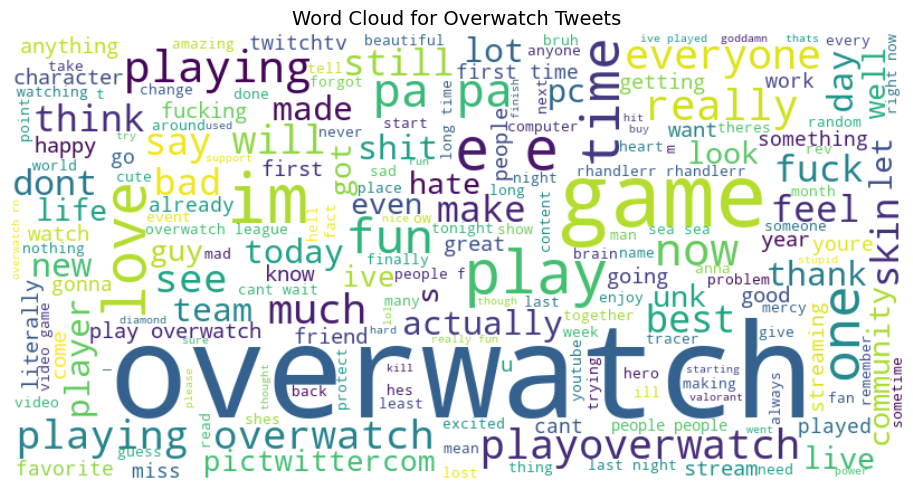

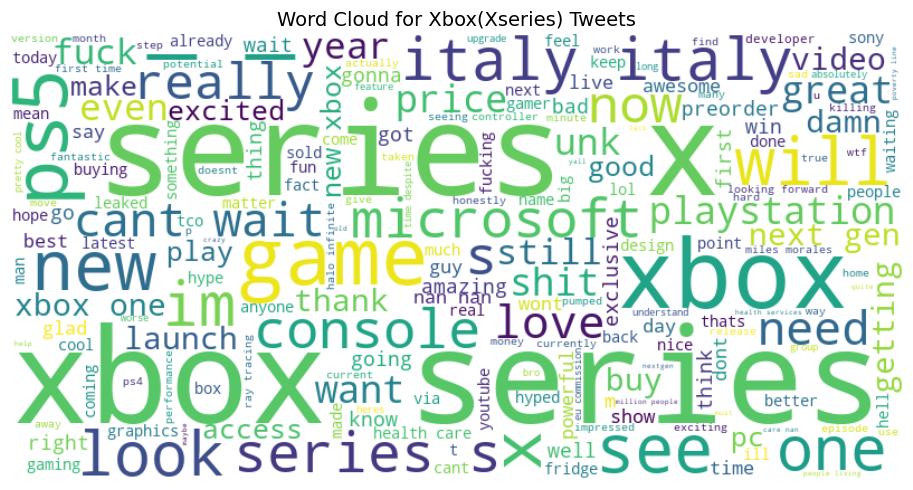

...

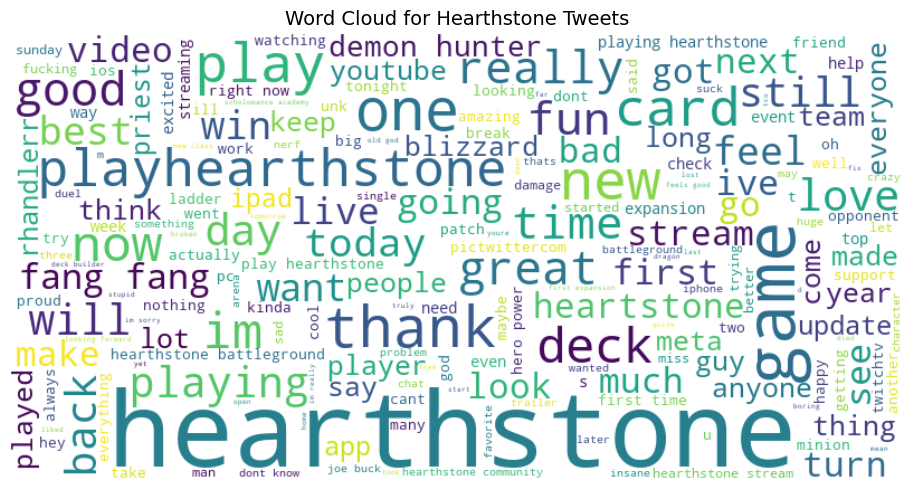

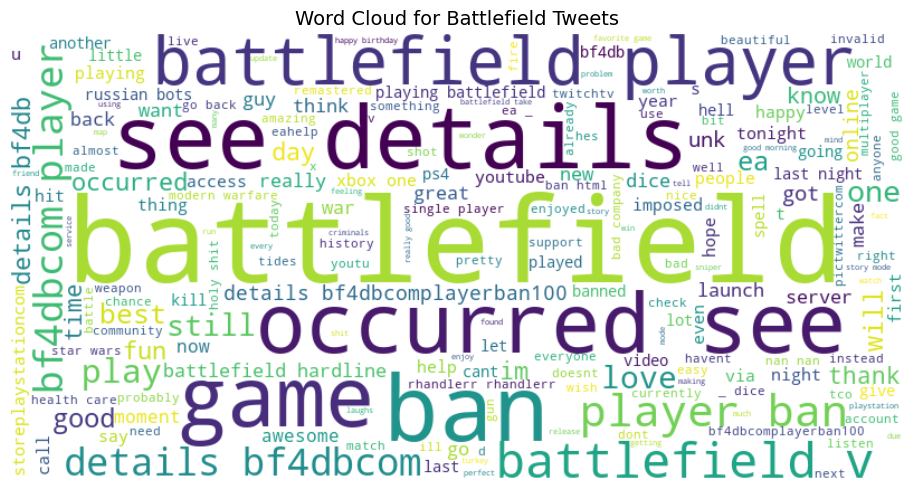

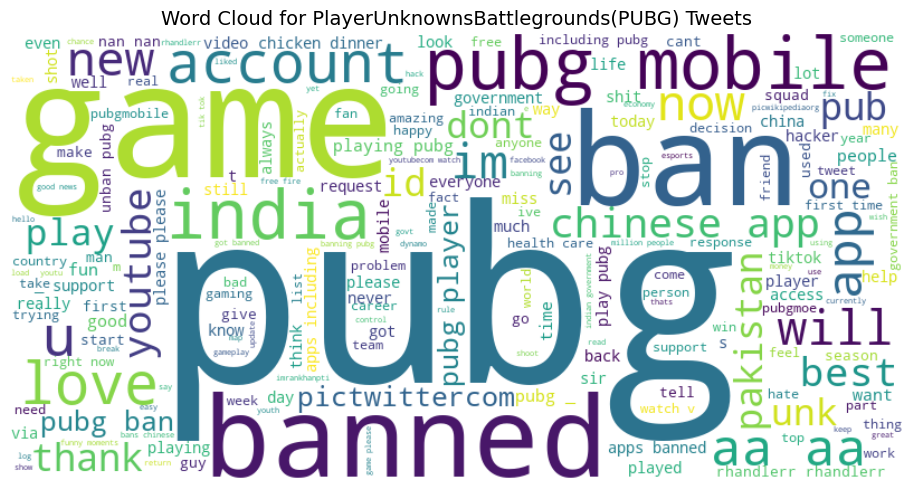

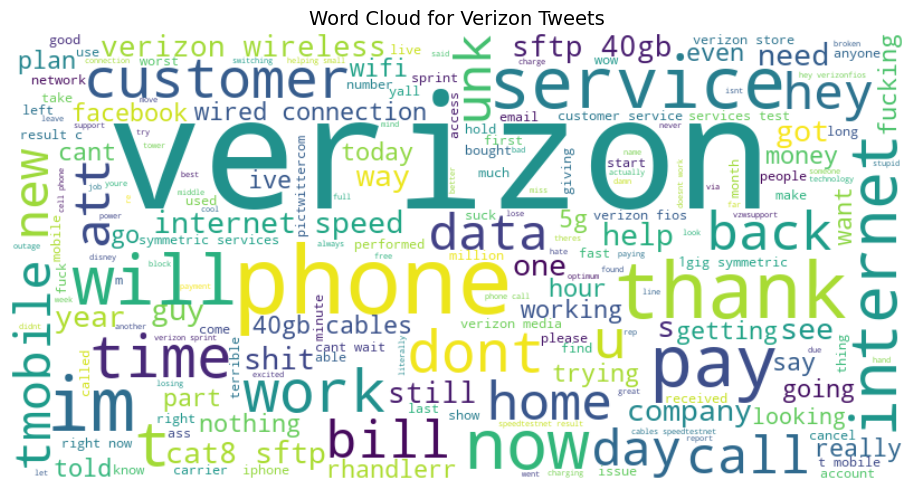

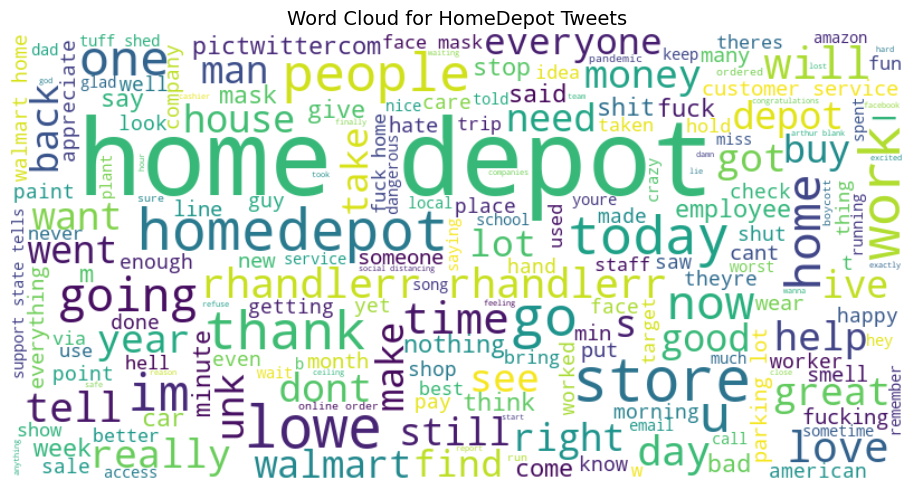

In [ ]:
from wordcloud import WordCloud

sentiments = train['sentiment'].unique()

for sentiment in sentiments:
    text = " ".join(train[train['sentiment'] == sentiment]['text'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {sentiment} Tweets", fontsize=14)
    plt.tight_layout()
    plt.show()